# Masking sunglint from satellite imagery <img align="right" src="../Supplementary_data/dea_logo.jpg">

* [**Sign up to the DEA Sandbox**](https://docs.dea.ga.gov.au/setup/sandbox.html) to run this notebook interactively from a browser
* **Compatibility:** Notebook currently compatible with the `DEA Sandbox` environment only
* **Products used:** 
[ga_s2am_ard_3](https://explorer.sandbox.dea.ga.gov.au/ga_s2am_ard_3)

## Background

Ocean tides are the periodic rise and fall of the ocean caused by the gravitational pull of the moon and sun and the earth's rotation. 
Tides in coastal areas can greatly influence how these environments appear in satellite imagery as water levels vary by up to 12 metres (e.g. in north-western Australia).
To be able to study coastal environments and processes along Australia's coastline, it is vital to obtain data on tidal conditions at the exact moment each satellite image was acquired.

## Description
This notebook demonstrates how to combine remotely sensed imagery with information about ocean tides using functions from the [`dea_tools.coastal` module](../Tools/dea_tools/coastal.py), allowing us to analyse satellite imagery by tidal stage (e.g. low, high, ebb, flow). 
These functions use the [Finite Element Solution 2014 (FES2014) tidal model](https://os.copernicus.org/articles/17/615/2021/) to calculate the height (relative to mean sea level, i.e. approximately equivalent to the Australian Height Datum or AHD) and stage of the tide at the exact moment each satellite image was acquired. 

These tide modelling tools and tide models underpin DEA products including [DEA Coastlines](https://cmi.ga.gov.au/data-products/dea/581/dea-coastlines#basics), [DEA Intertidal Extents (ITEM)](http://dx.doi.org/10.4225/25/5a602cc9eb358), [DEA High Low Tide Imagery (HLTC)](http://dx.doi.org/10.4225/25/5a615705d20f7), and [DEA Intertidal Elevation (NIDEM)](http://dx.doi.org/10.26186/5c4fc06a79f76).

The notebook demonstrates how to:

1. Model tide heights for specific coordinates and times using the `model_tides` function
2. Model tide heights for each satellite observation using the `tidal_tag` function
3. Use tide height data to produce median composites of the coast at low and high tide
4. Swap a dataset's dimensions to make it easier to select imagery from low to high tide.
5. Compute ebb or flow tide phase data to determine whether water levels were rising or falling in each satellite observation

Advanced tools:

6. Spatially model tides into each pixel of a satellite dataset using `pixel_tides`
7. Evaluate potential biases in the tidal conditions observed by a satellite using the `tidal_stats` function

***

## Getting started
To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages


In [53]:
import matplotlib.pyplot as plt

import datacube

import sys

sys.path.insert(1, '../Tools/')
from dea_tools.datahandling import load_ard
from dea_tools.coastal import glint_angle
from dea_tools.plotting import rgb


### Connect to the datacube


In [2]:
dc = datacube.Datacube(app='Sunglint_masking')

## Loading satellite image

First, we will load a sun-glint-affected Sentinel-2 image to demonstrate how sun-glint can affect satellite imagery.

In addition to our standard red, green and blue satellite bands, we will some additional `oa_*` bands that contain data about the angles of the sun and the satellite sensor when the image was taken.
We will use this data later to identify and mask out potential sung-glinted pixels.

In [76]:
spectral_bands = [
    "nbart_red",
    "nbart_green",
    "nbart_blue",
]

sunglint_bands = [
    "oa_solar_zenith",
    "oa_solar_azimuth",
    "oa_satellite_azimuth",
    "oa_satellite_view",
]


ds = load_ard(
    dc=dc,
    products=["ga_s2bm_ard_3"],
    time="2020-10-14",
    x=(126.30, 128.14),
    y=(-13.65, -14.20),
    measurements=spectral_bands + sunglint_bands,
    group_by="solar_day",
    resampling="average",
    resolution=(-100, 100),
    mask_pixel_quality=False,
)

Finding datasets
    ga_s2bm_ard_3
Loading 1 time steps


Now we can plot our result.

Look at the image below, comparing the dark water in the west (left) of the image to the water on the eastern side (right).
As we move towards the eastern side of the image, we can see the water surface growing brighter and washed out.
These bright pixels are the result of sun-glint: sunlight reflecting off the surface of the water directly towards the satellite sensor.

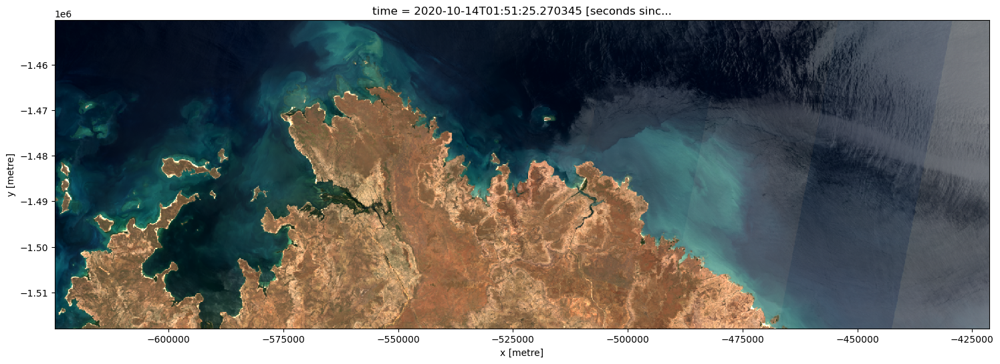

In [77]:
rgb(ds, vmin=50, vmax=1700)

### Calculating glint angles
Glint angles represent how closely the angle of the sun's reflection of the water surface matches up with the angle the satellite sensor is looking. 
A small angle indicates that sunlight is bouncing directly towards the satellite sensor, which can result in sunglint-affected pixels. 
Large angles however suggest that reflections are likely to be reflecting away from the satellite sensor, and therefore not affecting the imagery.


The `glint_angle` function is inspired by code from this [Medium post](https://towardsdatascience.com/how-to-implement-sunglint-detection-for-sentinel-2-images-in-python-using-metadata-info-155e683d50), and [Giglio et al. 2003](https://doi.org/10.1016/S0034-4257(03)00184-6).

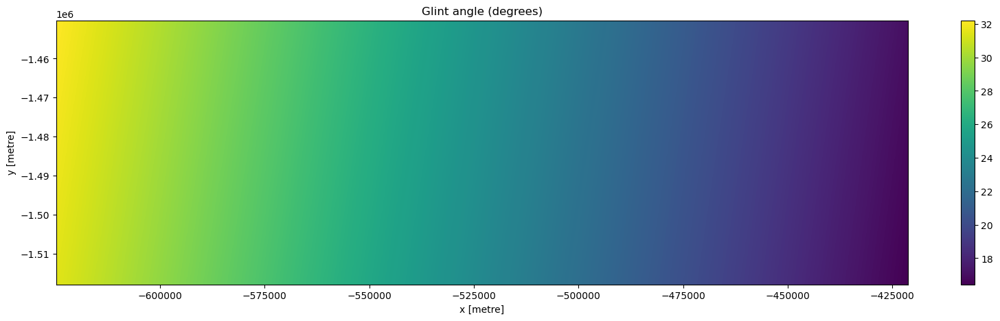

In [78]:
# Calculate glint angle using sensor and solar geometry
glint_array = glint_angle(
    solar_azimuth=ds.oa_solar_azimuth,
    solar_zenith=ds.oa_solar_zenith,
    view_azimuth=ds.oa_satellite_azimuth,
    view_zenith=ds.oa_satellite_view,
)

# Plot result
glint_array.plot(size=5, aspect=4)
plt.title("Glint angle (degrees)");

### Applying a sunglint mask
Now that we have calculated glint angles for each pixel in our image, we can use this information to mask out potentially sunglinted pixels.

There is no "correct" glint angle threshold to use to identify sunglint; here we use 20 degrees which is often a good starting point.
In the image below, any pixel with a glint angle of less than 20 degrees is set to nodata (`NaN`), removing it from our image:

/env/lib/python3.8/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


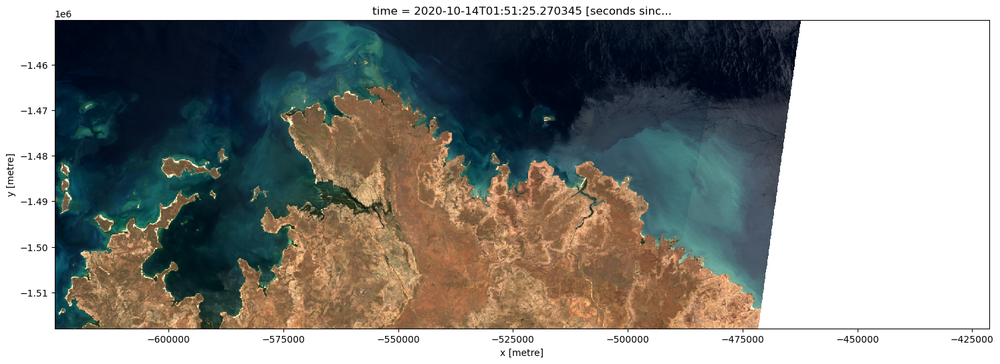

In [79]:
# Apply a glint mask using a 20 degree glint angle threshold
glint_mask = glint_array > 20
ds_glint_masked = ds.where(glint_mask)

# Plot our sunglint masked data
rgb(ds_glint_masked, vmin=50, vmax=1700)

You may notice a small amount of sunglint remains in the east of the image.

The exact choice of glint angle threshold will depend on your application, and how you weigh up removing all possible sunglint vs. losing some valid data.
In the example below, we apply a stricter glint threshold of 25 degrees.
This removes more glint, but leaves us with less data overall:

/env/lib/python3.8/site-packages/matplotlib/cm.py:478: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


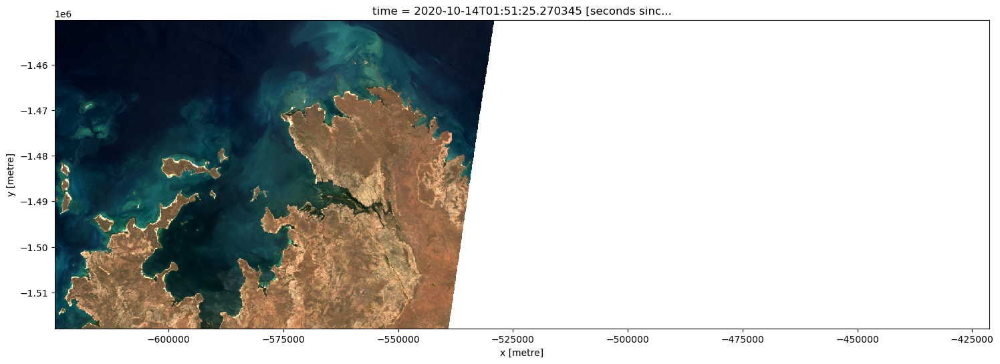

In [80]:
# Apply a glint mask using a 22 degree glint angle threshold
glint_mask = glint_array > 25
ds_glint_masked = ds.where(glint_mask)

# Plot our sunglint masked data
rgb(ds_glint_masked, vmin=50, vmax=1700)

In [109]:
ds = load_ard(
    dc=dc,
    products=["ga_s2bm_ard_3"],
    time=("2020-07-15", "2020-11-10"),
    x=(127.00, 128.14),
    y=(-13.65, -14.20),
    measurements=spectral_bands + sunglint_bands,
    group_by="solar_day",
    resampling="average",
    resolution=(-200, 200),
    mask_pixel_quality=True,
    cloud_mask="s2cloudless",
)

Finding datasets
    ga_s2bm_ard_3
Applying s2cloudless pixel quality/cloud mask
Loading 12 time steps


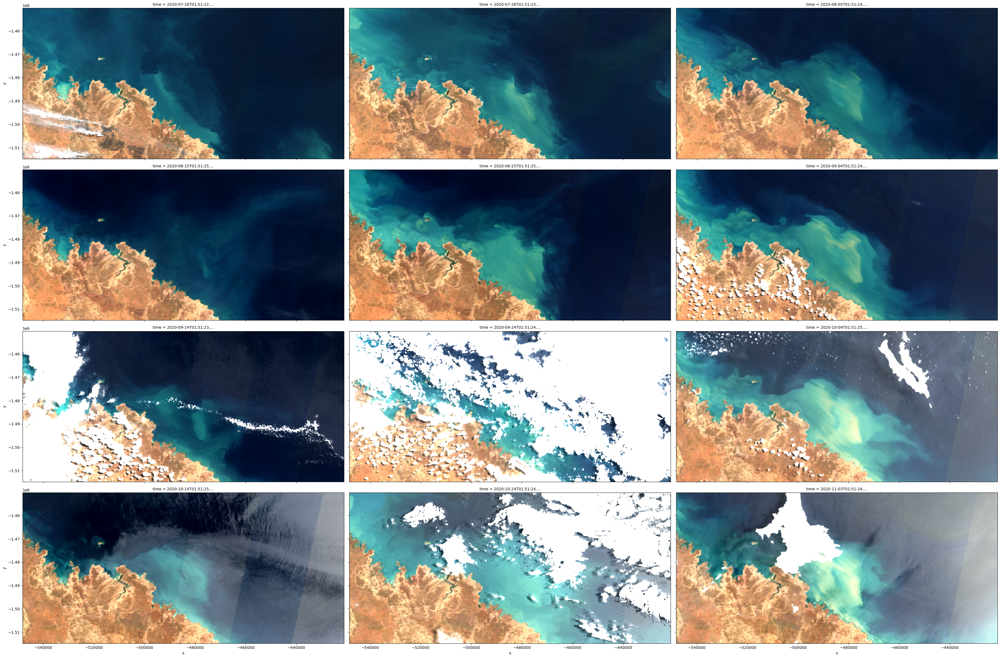

In [110]:
rgb(ds, col="time", col_wrap=3)

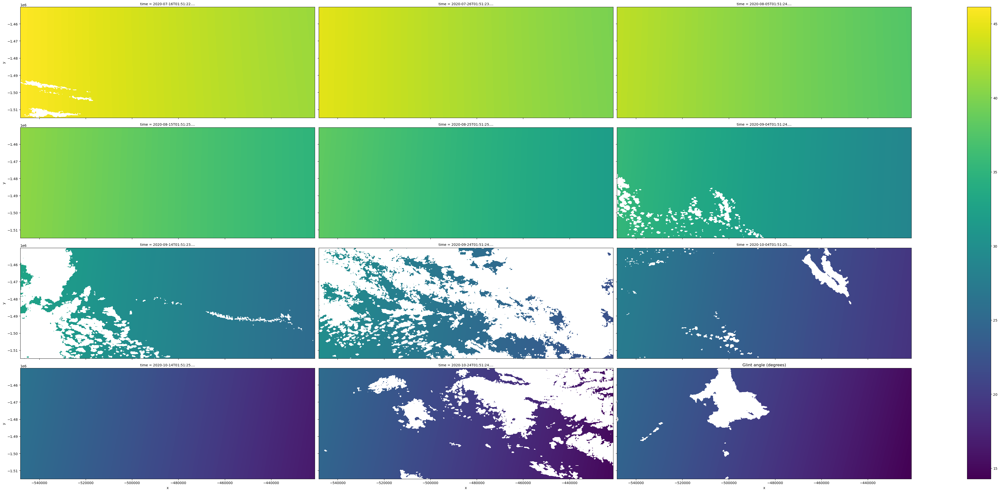

In [113]:
# Calculate glint angle using sensor and solar geometry
glint_array = glint_angle(
    solar_azimuth=ds.oa_solar_azimuth,
    solar_zenith=ds.oa_solar_zenith,
    view_azimuth=ds.oa_satellite_azimuth,
    view_zenith=ds.oa_satellite_view,
)

# Plot result
glint_array.plot.imshow(size=5, aspect=3, col="time", col_wrap=3)
plt.title("Glint angle (degrees)");

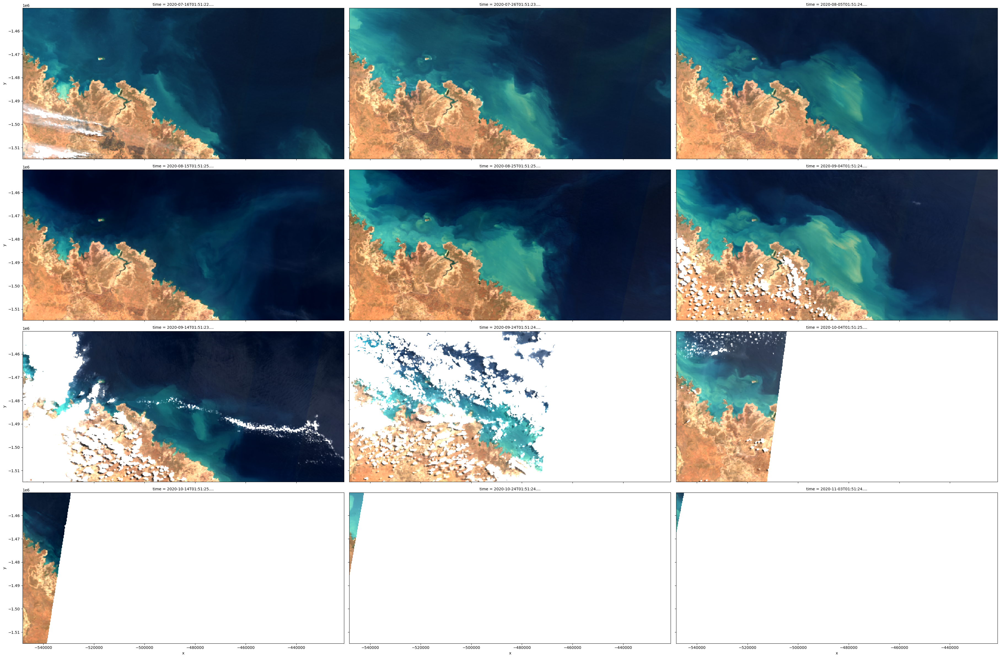

In [114]:
rgb(ds.where(glint_array > 25), col="time", col_wrap=3)

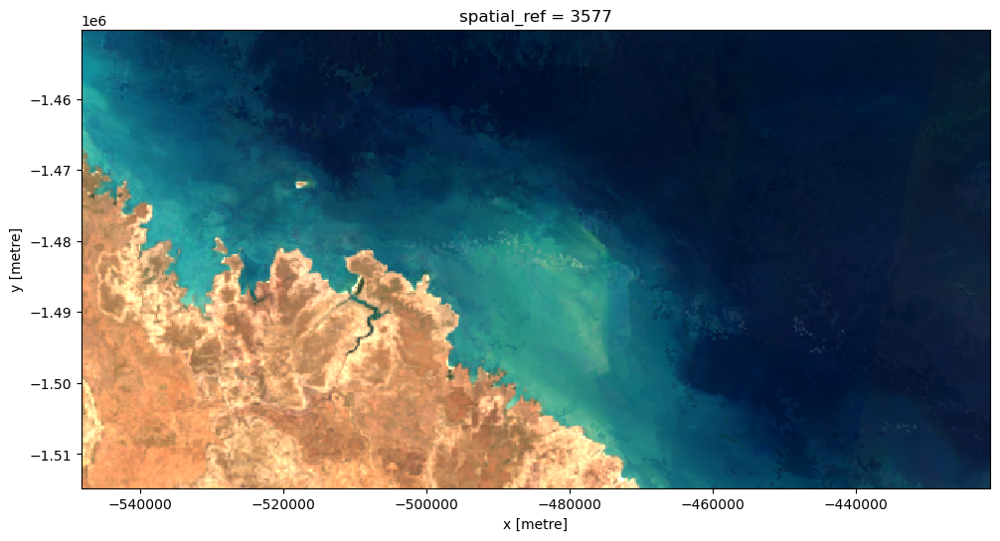

In [115]:
rgb(ds.median(dim="time"))

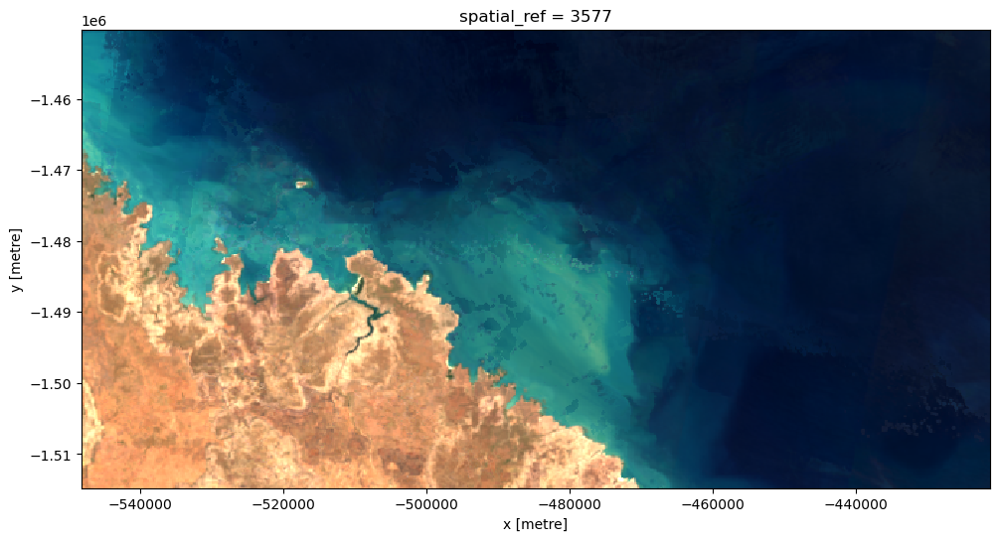

In [106]:
rgb(ds.where(glint_array > 25).median(dim="time"))

In [ ]:
glint_array.plot()

In [ ]:
ds = load_ard(
    dc=dc,
    products=["ga_s2am_ard_3"],
    time=("2020-11-16", "2020-12-09"),
    x=(136.00, 136.20),
    y=(-15.20, -15.40),
    measurements=[
        "nbart_red",
        "nbart_green",
        "nbart_blue",
        "solar_zenith",
        "solar_azimuth",
        "satellite_azimuth",
        "satellite_view",
    ],
    group_by="solar_day",
    resolution=(-30, 30),
    cloud_mask="s2cloudless",
)

In [ ]:
from odc.ui import select_on_a_map
from ipyleaflet import basemaps, basemap_to_tiles

# Plot interactive map to select area
basemap = basemap_to_tiles(basemaps.Esri.WorldImagery)
geom = select_on_a_map(height='600px',
                             layers=(basemap,),
                             center=(-26, 135), 
                             zoom=4)

In [ ]:
# dss = dc.find_datasets(product='s2a_ard_granule', id='e3e5d705-9f37-5016-9c9f-4df89c7e80d1')

ds = dc.load(product=['ga_s2am_ard_3', 'ga_s2bm_ard_3'],   #['ga_s2am_ard_3', 'ga_s2bm_ard_3'], 
#              time='2022-10-07',
             time=('2021-01', '2021-12'),
             geopolygon=geom,
             measurements=['nbart_red', 'nbart_green', 'nbart_blue', 'nbart_nir_1',
                           'solar_zenith', 'solar_azimuth', 
                           'satellite_azimuth', 'satellite_view', 
                           'relative_azimuth'], 
             output_crs='EPSG:3577', 
             group_by='solar_day',
             dask_chunks={},
             resolution=(-10, 10))

ds = ds.where(ds.nbart_red > 0).compute()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def glint_angle(solar_azimuth, solar_zenith, view_azimuth, view_zenith):
    """
    Calculates glint angles for each pixel in a satellite
    image based on the relationship between the solar and
    sensor zenith and azimuth viewing angles at the moment
    the image was acquired.

    Glint angle is considered a predictor of sunglint over
    water; small glint angles (e.g. < 20 degrees) are associated
    with a high probability of sunglint due to the viewing
    angle of the sensor being aligned with the specular
    reflectance of the sun from the water's surface.

    Based on code from https://towardsdatascience.com/how-to-implement-
    sunglint-detection-for-sentinel-2-images-in-python-using-metadata-
    info-155e683d50
    """

    # Convert angle arrays to radians
    solar_zenith_rad = np.deg2rad(solar_zenith)
    solar_azimuth_rad = np.deg2rad(solar_azimuth)
    view_zenith_rad = np.deg2rad(view_zenith)
    view_azimuth_rad = np.deg2rad(view_azimuth)

    # Calculate sunglint angle
    phi = solar_azimuth_rad - view_azimuth_rad
    glint_angle = np.cos(view_zenith_rad) * np.cos(solar_zenith_rad) - np.sin(
        view_zenith_rad
    ) * np.sin(solar_zenith_rad) * np.cos(phi)

    # Convert to degrees
    glint_array = np.degrees(np.arccos(glint_angle))

    return glint_array


glint_array = glint_angle(
    solar_azimuth=ds.solar_azimuth,
    solar_zenith=ds.solar_zenith,
    view_azimuth=ds.satellite_azimuth,
    view_zenith=ds.satellite_view,
)

# glint_array.plot(cmap="magma_r", col='time', col_wrap=5)

In [ ]:
ds['nbart_red'].std('time').plot.imshow(vmin=0, vmax=2000, size=5)

In [ ]:
ds['nbart_red'].where(glint_array > 30).std('time').plot.imshow(vmin=0, vmax=2000, size=5)

In [ ]:
ds[['nbart_red', 'nbart_green', 'nbart_blue']].to_array().median(dim="time").plot.imshow(vmin=0, vmax=2500, size=5)

In [ ]:
ds[['nbart_red', 'nbart_green', 'nbart_blue']].to_array().where(glint_array > 30).median(dim="time").plot.imshow(vmin=0, vmax=2500, size=5)

In [ ]:
ndwi = (ds.nbart_green - ds.nbart_nir_1) / (ds.nbart_green + ds.nbart_nir_1)
glint = glint_array < 30
glint_mask = ~(glint & (ndwi > 0))
ds[['nbart_red', 'nbart_green', 'nbart_blue']].to_array().where(glint_mask).median(dim="time").plot.imshow(vmin=0, vmax=2500, size=5)

In [ ]:
import odc.geo.xr
ds[['nbart_red', 'nbart_green', 'nbart_blue']].to_array().where(glint_mask).median(dim="time").odc.write_cog("test_median.tif", overwrite=True)

In [ ]:
ndwi.where(~glint).median(dim="time").plot.imshow(vmin=-0.5, vmax=0.5, size=5)

In [ ]:
ndwi.where(glint_mask).median(dim="time").plot.imshow(vmin=-0.5, vmax=0.5, size=5)